# Examining mobility networks
Daily OD matrices are the data source

In [12]:
import numpy as np
import pandas as pd
from pathlib import Path
from datetime import datetime
from tqdm import tqdm
from matplotlib import dates
import matplotlib.pyplot as plt
import seaborn as sns
import sys; sys.path.append('../')
from src.data_loader.data_loader import *
from src.utils.dates import get_today, lag_date, date2str, str2date, get_format
from src.utils.df_utils import get_date_columns
from src.pandas.align import align_lagged_dates

from scipy.stats import spearmanr

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
home_dir = Path(os.environ['HOME']) / 'Downloads'
OD_dir = home_dir / 'Raw_OD'

In [3]:
ODs = []
for f in os.listdir(OD_dir)[:2]:
    if not f.startswith('.'):
        ODs.append(pd.read_csv(OD_dir / f))

In [14]:
def get_square_Xy(df):
    # string headers -> int
    col_fips = df.drop(labels=['origin'], axis=1).columns
    df.rename(columns = {c:int(c) for c in col_fips}, inplace=True)
    # Drop columns not in the rows
    df.drop(columns=list(set(df.columns[1:]).difference(set(df['origin']))), inplace=True)
    # Drop rows not in the columns
    df = df[~df['origin'].isin(set(df['origin']).difference(set(df.columns[1:])))]
    # Sort the rows and columns in ascending oridin
    df = df[['origin'] + sorted(df.drop(columns='origin').columns)]
    df = df.sort_values(by='origin', axis=0)
    # Convert fo matrix
    X = df.drop(columns='origin').to_numpy()
    y = df['origin']

    return X,y

In [5]:
X,y = get_square_Xy(ODs[0])
np.sum(X == 0) / X.shape[0]**2

0.9389089821088077

In [8]:
X[:4,:4]

array([[8.79842687e+04, 1.39487701e+02, 9.72839506e+00, 1.17404061e+02],
       [2.30985081e+02, 3.74059074e+05, 1.35352798e+02, 3.07892554e+01],
       [5.09668498e+01, 3.64313364e+01, 4.09278234e+04, 0.00000000e+00],
       [1.33746306e+02, 2.37362409e+02, 5.03115710e+01, 3.07108477e+04]])

## Inter/Intra baseline movement

In [14]:
count_dict = {}
inter_dict = {}
in_dict = {}
out_dict = {}
for f in os.listdir(OD_dir)[:14]:
    df = pd.read_csv(OD_dir / f)
    X,ys = get_square_Xy(df)
    inter = np.diag(X)
    total_in = np.sum(X, axis=0)
    total_out = np.sum(X, axis=1)
    for y,t_in,t_out,i in zip(ys,total_in,total_out,inter):
        if y not in count_dict.keys():
            count_dict[y] = 1
            inter_dict[y] = i
            in_dict[y] = t_in - i
            out_dict[y] = t_out - i
        else:
            count_dict[y] += 1
            inter_dict[y] += i
            in_dict[y] += t_in - i
            out_dict[y] += t_out - i


In [15]:
rows = [[y,
        inter_dict[y] / count,
        in_dict[y] / count,
        out_dict[y] / count,
        ] for y,count in count_dict.items()]
mobility_df = pd.DataFrame(rows, columns=['FIPS', 'inter_movement', 'in_movement', 'out_movement'])

In [16]:
mobility_df.to_csv('../data/processed/od_mobility_baseline.csv', index=False)

## Inter mobility dataframe

In [15]:
for i,f in enumerate(os.listdir(OD_dir)):
    if f.startswith('.'):
        continue
    df = pd.read_csv(OD_dir / f)
    date = f[5:-4]
    X,y = get_square_Xy(df)
    X = np.diag(X)

    temp = pd.DataFrame({'FIPS': y, date: X}, columns=['FIPS', date])

    if i == 0:
        inter_df = temp
    else:
        inter_df = inter_df.merge(temp, on='FIPS')

In [24]:
inter_df = inter_df.reindex([inter_df.columns[0]] + sorted(inter_df.columns[1:]), axis=1)

In [27]:
date = inter_df.columns[-1]
print(f'Date {date}')
inter_df.to_csv(f'../data/processed/od_inter_mobilities_{date}.csv', index=False)

Date 05-20


## Spectrum Analysis

In [18]:
from graspy.plot import pairplot, heatmap
from graspy.cluster import KMeansCluster, GaussianCluster
from graspy.embed import LaplacianSpectralEmbed, AdjacencySpectralEmbed

In [19]:
Xs = []
ys = []
for f in os.listdir(OD_dir)[:13]:
    df = pd.read_csv(OD_dir / f)
    X,y = get_square_Xy(df)
    Xs += [X]
    ys += [y]

In [ ]:
FIPS = sorted(list(set(ys[0]).intersection(*ys[1:])))

In [ ]:
baseline_A = np.asarray(Xs).mean(axis=0)

In [67]:
ase = AdjacencySpectralEmbed()
Ahat = ase.fit_transform(np.log(baseline_A + 1))

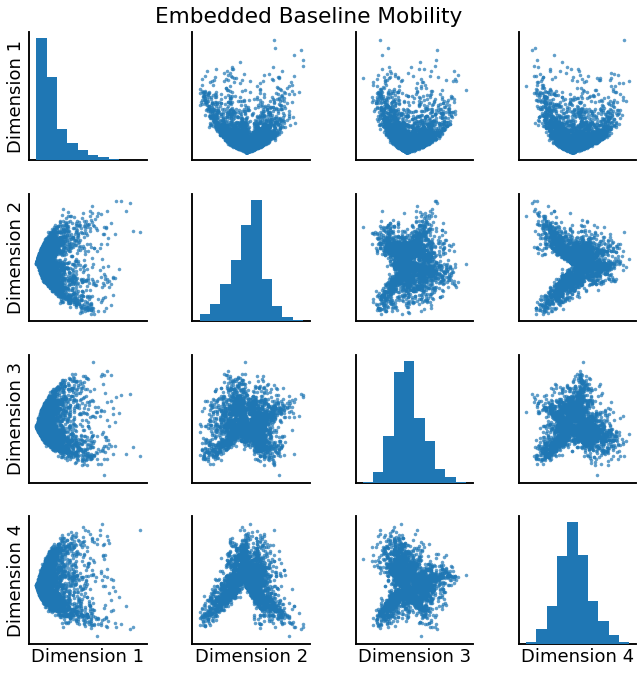

In [68]:
pairplot(Ahat[0], title='Embedded Baseline Mobility')

In [69]:
cum_deaths = pd.read_csv('../data/processed/cumulative_deaths_14_days_after.csv')

In [90]:
temp = pd.DataFrame(
    [[fip,0] for fip in set(y).difference(set(cum_deaths['FIPS']))], columns=['FIPS', 'cum_deaths']
    )
cum_deaths = pd.concat([cum_deaths, temp])

In [100]:
death_labels = cum_deaths.sort_values(by='FIPS', axis=0)['cum_deaths']

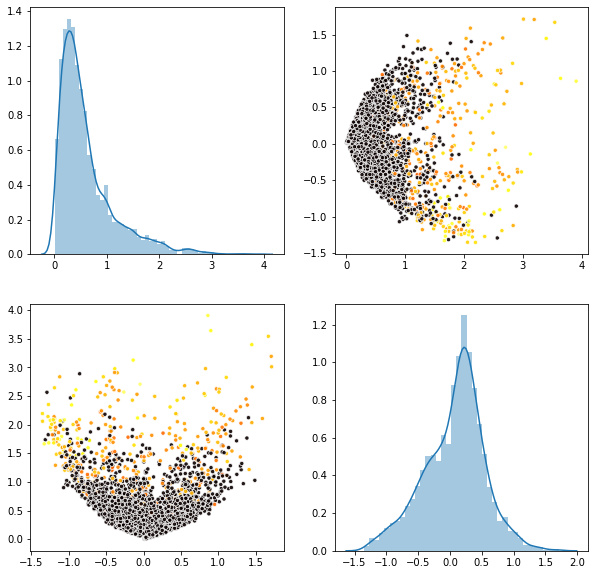

In [154]:
X = Ahat[0][:,:2]
y = list(death_labels)
fig,ax = plt.subplots(X.shape[1], X.shape[1], figsize=(10,10))
for i in range(X.shape[1]):
    for j in range(X.shape[1]):
        if i==j:    # diagonal
            sns.distplot(X[:,i], kde=True, ax=ax[i][j])
        else:       # off diagonal
            sns.scatterplot(
                x=X[:,i],
                y=X[:,j],
                hue=np.log(np.asarray(y)+1),
                palette='hot', legend=False, size=0.01, alpha=0.9, ax=ax[i][j]
                )